In [0]:
try:
  import tflearn # try to import tflearn
except ImportError:
  !pip3 install -q tflearn # install tflearn first
  import tflearn # then import it

In [0]:
import matplotlib.pyplot as plt # used for plotting images
import numpy as np # to do math functions
import os, sys # to interact with filesystem
import tensorflow as tf # tensorflow during training
from tflearn.activations import relu # rectified linear activation function; if you send in x, if x < 0, make it 0 (get rid of negative numbers)

# normalize data
from tflearn.layers.normalization import batch_normalization as bn # takes inputs (raw or previous layer) and tries to make distribution of all of them normal (bellcurve); helps you train faster
from scipy.misc import imread, bytescale, imresize # image manipulation functions
from tflearn.layers.core import input_data, dropout, fully_connected # dropout helps you adapt to noise better & changes in the system
from tflearn.layers.conv import conv_2d, max_pool_2d, global_avg_pool
from tflearn.layers.estimator import regression # trainer for the network

# turns scalar label into vector where appropriate class is value 1 and others 0
from tflearn.data_utils import to_categorical

# makes new images from the ones we have by flipping them, rotating, etc. (adapt to new data/avoid overfitting)
from tflearn.data_augmentation import ImageAugmentation

# to visualize the data
from tensorflow.contrib.tensorboard.plugins import projector

In [0]:
def install_tensorboard_dep():
  # installs tensorboard
  if 'ngrok-stable-linux-amd64.zip' not in os.listdir(os.getcwd()):
    !wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
    !unzip ngrok-stable-linux-amd64.zip
    os.system('n')
    
def montage(x, plot_shape=(15, 15), return_grid=False, cmap='viridis'):
  '''
  Takes in a 4-D tensor, x, of shape [NxHxWxC] and puts all of the images
  together in a single matrix to show as one image. If return_grid is True, 
  it will not show the matrix, but return it to be used in some other 
  operations.
  '''
  
  count = 0
  if not return_grid:
    scale = [0, 255]
  else:
    scale = [0, 1]
  
  
  if len(x.shape) == 4 and x.shape[-1] == 3:
    num, m, n, c = x.shape
  else:
    num, m, n = x.shape
    c = 1
    
  num = int(np.ceil(np.sqrt(num)))
  grid = np.zeros([num*m, num*n, c])
  
  if c == 1:
    grid = grid[..., 0]
  
  for i in range(num):
    for j in range(num):
      if count < x.shape[0]:
        if c == 1:
          grid[i*m:i*m+m, j*n:j*n+n] = bytescale(x[count, ...], 
                                                 low=scale[0], high=scale[1])
        else:
          grid[i*m:i*m+m, j*n:j*n+n, :] = bytescale(x[count, ...],
                                                    low=scale[0], high=scale[1])
        count += 1 
        
  if return_grid:
    return grid
  else:
    fig = plt.figure(figsize=plot_shape)
    a1 = fig.add_subplot(111)
    a1.set_xticks(np.arange(-0.5, num*n, n))
    a1.set_yticks(np.arange(-0.5, num*m, m))
    a1.set_yticklabels([])
    a1.set_xticklabels([])
    a1.imshow(grid, cmap=cmap)
    plt.show()
    
def start_tensorboard():
  # starts tensorboard on colaboratory
  LOG_DIR = '/tmp/tflearn_logs' # where the log files will go
  get_ipython().system_raw('tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'.format(LOG_DIR))
  get_ipython().system_raw('./ngrok http 6006 &')
  ! curl -s http://localhost:4040/api/tunnels | python3 -c \
  "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"
      
def viz_embedding(tensor, images, labels, shape):
  # used to transform each image into 3 dimensions and plot the space of the images
  tb_dir = '/tmp/tflearn_logs'
  sess = tf.Session()
  sess.run(tensor.initializer)
  summary_writer = tf.summary.FileWriter(tb_dir)
  config = projector.ProjectorConfig()
  embedding = config.embeddings.add()
  embedding.tensor_name = tensor.name
  embedding.metadata_path = os.path.join(tb_dir, 'metadata.tsv')
  embedding.sprite.image_path = os.path.join(tb_dir, 'flowers.png') 
  embedding.sprite.single_image_dim.extend(shape)
  projector.visualize_embeddings(summary_writer, config)
  saver = tf.train.Saver([tensor])
  saver.save(sess, os.path.join(tb_dir, 'flowers.ckpt'), 1)
  
  image_grid = montage(images, return_grid=True)
  plt.imsave(os.path.join(tb_dir, 'flowers.png'), image_grid)
  
  with open(os.path.join(tb_dir, 'metadata.tsv'),'w') as f:
    f.write("Index\tLabel\n")
    for index,label in enumerate(labels):
      f.write("%d\t%d\n" % (index,label))
  f.close()

In [4]:
response = input('Do you want to train a network? (y/n) ') # ask user if they want to train or load

# if input was Y, y, Yes, or yes, train a network. if not, load a trained one
if response in ['Y','y', 'Yes', 'yes']:
   Train = True
else:
  Train = False

Do you want to train a network? (y/n) y


In [5]:
print(Train)

True


In [6]:
# import dataset loader from tflearn
import tflearn.datasets.oxflower17 as oxflower17

# load the data in as X and the labels in as Y
X, Y = oxflower17.load_data(one_hot=True, resize_pics=(150,150)) # 17 different flowers, will go from 0 to 16; each flower gets number (vector, so 16 0's, one 1)

100.0% 60276736 / 60270631


('Succesfully downloaded', '17flowers.tgz', 60270631, 'bytes.')
File Extracted
Starting to parse images...
Parsing Done!


In [7]:
print(X.shape, Y.shape) # print the shape of data and labels
print(Y[:10, ...]) # print the first 10 label vectors

(1360, 150, 150, 3) (1360, 17)
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]


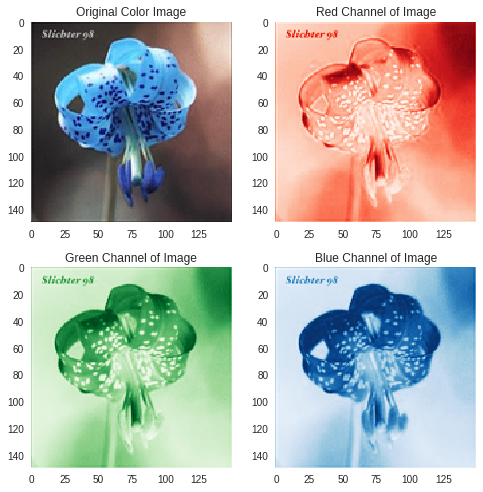

In [8]:
# understanding the channels

fig = plt.figure(figsize=(7,7)) # create a figure of size 7x7
a1 = fig.add_subplot(221) # add the first of four subplots in the figure (2=rows,2=columns,1=label)
a2 = fig.add_subplot(222) # add the second of four subplots in the figure
a3 = fig.add_subplot(223) # add the third of four subplots in the figure
a4 = fig.add_subplot(224) # add the fourth of four subplots in the figure

x_show = X[0, :, :, ::-1] # get the first image out of dataset X

a1.imshow(bytescale(x_show)) # show the original image
a2.imshow(x_show[..., 0], cmap='Reds') # show the first color channel (red) of the image
a3.imshow(x_show[..., 1], cmap='Greens') # show the second color channel (green) of the image
a4.imshow(x_show[..., 2], cmap='Blues') # show the third color channel (blue) of the image

# matplotlib always adds grids/etc, so remove grid and tick lines
a1.grid(False)
a2.grid(False)
a3.grid(False)
a4.grid(False)

# name each subplot
a1.set_title('Original Color Image')
a2.set_title('Red Channel of Image')
a3.set_title('Green Channel of Image')
a4.set_title('Blue Channel of Image')

plt.tight_layout() # helps organize figure if there are too many subplots

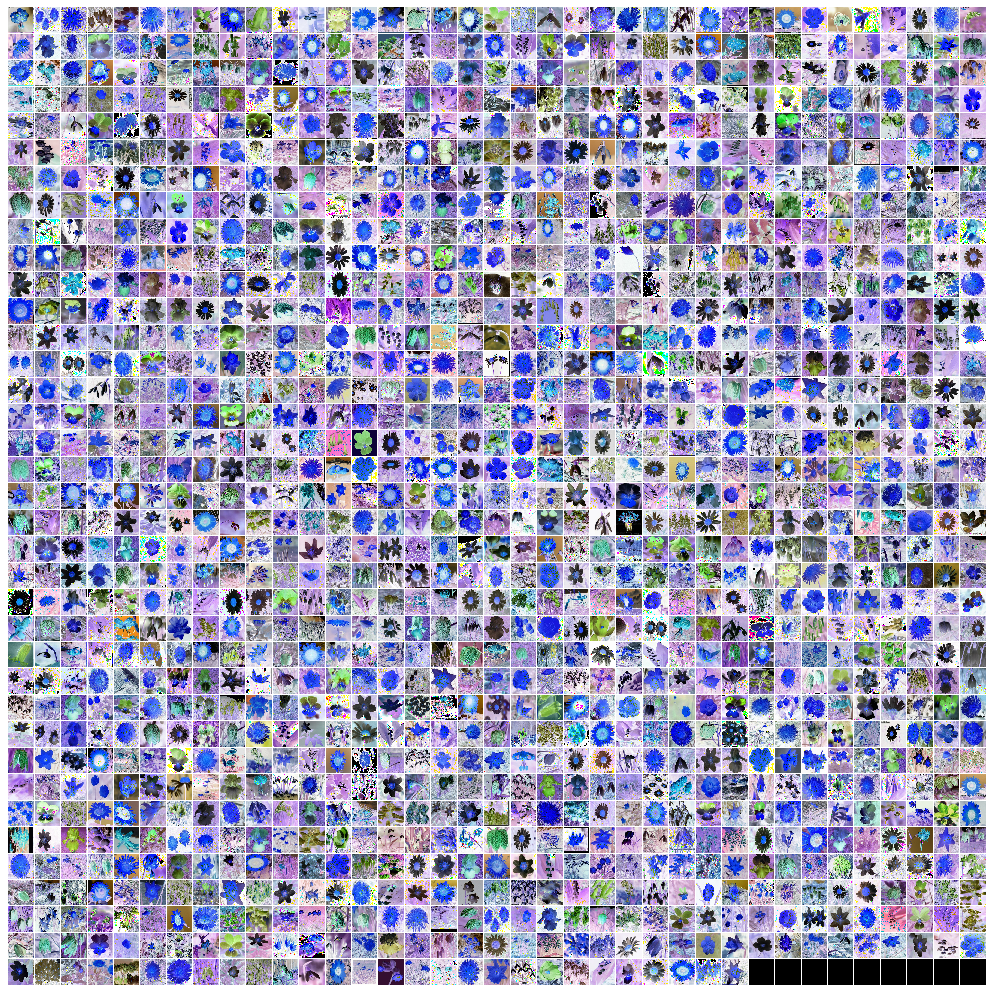

In [9]:
# use montage function to look at all images
montage(X, (18, 18)) # taking in X, sizing images 18x18; matplotlib messed up the color channels

In [0]:
# image; random weights and slide around (do one convolution by hand)
random_img = X[100, ...] # take the 100th image from the dataset
weight_filter = np.random.randn(5, 5, 3) # make random weights; filter = 5 pixels wide, 5 pixels high, all 3 channels at once
# map = where was the point where I found the feature in the image and how much did I find it?
output_feature_map = np.zeros([random_img.shape[0], random_img.shape[1]]) # create empty feature map

In [0]:
# just going to look for one specific random feature; for loop across every single pixel
for i in range(random_img.shape[0]-5): # loop through rows
  for j in range(random_img.shape[0]-5): # loop through columns
    output_feature_map[i, j] = np.sum(weight_filter * random_img[i:i+5, j:j+5, :]) # slide weight filter over this part of image, multipy element-wise, then sum up
    # weighted sum

In [12]:
print(np.amax(output_feature_map), np.amin(output_feature_map))

9.470694242244369 -1.2175504965630297


In [0]:
output_feature_map = bytescale(output_feature_map)

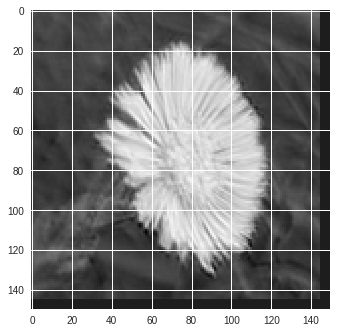

In [14]:
plt.imshow(output_feature_map, cmap='gray')

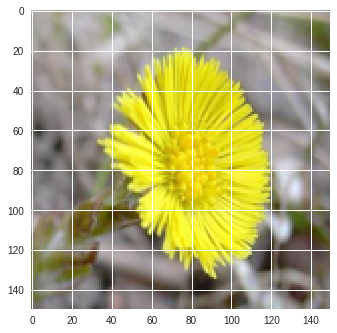

In [15]:
plt.imshow(random_img)

In [0]:
# need to set negative values to 0; make negative activation values 0 and keep positive ones
output_feature_map = np.int32(output_feature_map > 0) * output_feature_map # if the value is greater than 0, return 1; if less than 0, return 0

In [17]:
print(output_feature_map.shape)

(150, 150)


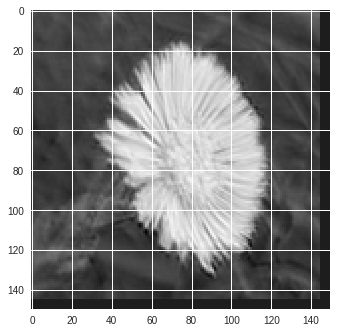

In [18]:
plt.imshow(output_feature_map, cmap='gray')

In [0]:
# preprocess by subtracting mean and dividing by standard deviation (subtract the mean from each value, everything will center on 0, i.e. origin)
# i.e. normalizing/making data have a normal distribution
X -= np.mean(X, 0) # center each pixel value around 0
X /= np.std(X, 0) #squash each pixel to between -1 and 1

(array([8.500000e+02, 5.138000e+03, 1.051000e+04, 2.470000e+04,
        4.701700e+04, 7.110500e+04, 9.616500e+04, 1.266020e+05,
        1.608480e+05, 2.050790e+05, 2.684010e+05, 3.692120e+05,
        5.376280e+05, 7.226760e+05, 9.138780e+05, 1.098723e+06,
        1.186545e+06, 1.318433e+06, 1.722902e+06, 2.431488e+06,
        3.097688e+06, 2.965086e+06, 2.831198e+06, 2.743231e+06,
        2.668529e+06, 2.606092e+06, 2.552041e+06, 2.489250e+06,
        2.438241e+06, 2.380077e+06, 2.328379e+06, 2.275114e+06,
        2.218911e+06, 2.155259e+06, 2.095465e+06, 2.036038e+06,
        1.981015e+06, 1.921075e+06, 1.863714e+06, 1.814725e+06,
        1.759491e+06, 1.701741e+06, 1.643018e+06, 1.590120e+06,
        1.539040e+06, 1.487779e+06, 1.440032e+06, 1.396632e+06,
        1.358030e+06, 1.313803e+06, 1.274274e+06, 1.231568e+06,
        1.187711e+06, 1.147255e+06, 1.104273e+06, 1.068391e+06,
        1.030872e+06, 9.920020e+05, 9.207060e+05, 8.449320e+05,
        7.750820e+05, 6.923370e+05, 6.37

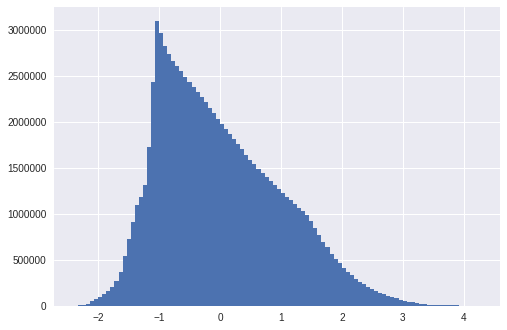

In [20]:
plt.hist(X.flatten(), bins=100)

In [0]:
# start building the network now

tf.reset_default_graph() # reset the tensorflow graph/network description (if you've already done a network in your notebook)

In [0]:
# image augmentation techniques: we only have 1,360 images, so we want to get more out of it (can rotate originals, flip, take random crops out of them...); same image, but computer thinks it's different
img_aug = ImageAugmentation()
img_aug.add_random_flip_leftright() # if it chooses an image randomly, will flip it left or right
img_aug.add_random_rotation(max_angle=33.) # randomly rotate images up to 33 degrees
img_aug.add_random_crop((150, 150), padding=15) # randomly crop a 120x120 frame out of image

# pretty sure it does this to 50% of them (at least just the flipping)

In [0]:
# create a layer to view dataspace in tensorboard
emb = tf.Variable(X[::10, ...], name='input_flower_images')

In [24]:
# create input layer that takes in images and augments them as well
in_layer = input_data(shape=[None, 150, 150, 3], data_augmentation=img_aug) # do this augmentation for each batch

# next 3 = kind of a template for CNNs

# have 64, 7x7 filters slide over the input images
conv1 = conv_2d(in_layer, 64, 7, activation='linear', name='c1') # 64 different filters for 64 different features – arbitrary number; 7x7 = size of filter; no activation function in this layer

# next layer takes in the first layer; normalize conv1 layer
batch_norm1 = bn(conv1) # normalize layers within the network––the feature maps

# perform relu activation function
relu1 = relu(batch_norm1) # get rid of negative numbers

# max pooling - reduce some dimensionality; downsample
pool1 = max_pool_2d(relu1, 3, 2) # move over two pixels at a time; just looking for max value, not specific pattern

# second conv layer with 128, 3x3 filters
conv2 = conv_2d(pool1, 128, 3, activation='linear', name='c2')
batch_norm2 = bn(conv2, name='bn2') 
relu2 = relu(batch_norm2)
pool2 = max_pool_2d(relu2, 3, 2)

# third conv layer with 256, 3x3 filters
conv3 = conv_2d(pool2, 256, 3, activation='linear', name='c3')
batch_norm3 = bn(conv3, name='bn3') 
relu3 = relu(batch_norm3) # relu on normalized c3 heat maps -- num_images x 37 x 37 x 256

# take the average of each of the 256 feature maps -- num_images x 1 x 1 x 256
gap = global_avg_pool(relu3)

# output layer
out_layer = fully_connected(gap, 17, activation='softmax', name='fc') # softmax: look at each value (0 to 1) and interpret as probability; should all add up to 1



Instructions for updating:
Use tf.initializers.variance_scaling instead with distribution=uniform to get equivalent behavior.


In [25]:
# describe how to optimize the network's weights
network = regression(out_layer, optimizer='adam',
                    loss='categorical_crossentropy', learning_rate=.001)

Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [0]:
# build the network based on the description above
model = tflearn.DNN(network, tensorboard_verbose=2)

In [27]:
# name for tensorboard
tensorboard_name = 'flowers_cnn'
viz_embedding(emb, X[::10, ...], np.argmax(Y[::10, ...], 1), [150, 150, 3]) # every 10th image and 10th label; what position is it?

Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'NoneType' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'ImageAugmentation' object has no attribute 'name'
Type is unsupported, or the types of the items don't match field type in CollectionDef. Note this is a warning and probably safe to ignore.
'dict' object has no attribute 'name'


In [28]:
# start tensorboard
install_tensorboard_dep()
start_tensorboard()

--2018-10-15 17:58:59--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.72.245.79, 52.72.251.164, 52.72.145.109, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.72.245.79|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5363700 (5.1M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]   5.11M  21.7MB/s    in 0.2s    

2018-10-15 17:59:00 (21.7 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [5363700/5363700]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   
http://65454550.ngrok.io


In [30]:
if Train:
  model.fit(X, # input data
            Y, # corresponding labels
            n_epoch=50, # number of times to go through entire dataset
            shuffle=True, # shuffle the images each epoch
            validation_set=0.1, # use 10% for validation
            show_metric=True, # show validation accuracy/loss in tensorboard
            batch_size=50, # go through dataset 50 examples at a time
            run_id='OxfordFlowers_CNN') # name that will show up on tensorboard
  
  # fit data X to labels Y; no testing set to give it, so take 10% of X&Y and use as testing set; show this in tensorboard

  # save the trained model for later
  model.save('flowers_CNN')

Training Step: 1249  | total loss: 0.59354 | time: 15.132s
| Adam | epoch: 050 | loss: 0.59354 - acc: 0.8123 -- iter: 1200/1224
Training Step: 1250  | total loss: 0.59103 | time: 16.777s
| Adam | epoch: 050 | loss: 0.59103 - acc: 0.8110 | val_loss: 1.09393 - val_acc: 0.6838 -- iter: 1224/1224
--
INFO:tensorflow:/content/flowers_CNN is not in all_model_checkpoint_paths. Manually adding it.


In [0]:
sess = tf.Session() # tensorflow session
sess.run(tf.global_variables_initializer())

In [0]:
# load in feature maps 
def load_layer(layer_name, data):
  layer = sess.run(layer_name, {in_layer:data[None, ...]})
  print(layer.shape)
  return layer

In [0]:
# view feature maps; montage takes something with three channels or one channel; we're going to combine feature maps with the number
def view_feature_map(layer):
  n, h, w, c = layer.shape # get layer's shape (number, height, width, channels)
  layer = layer.transpose((0, 3, 1, 2)).reshape([n*c, h, w])
  montage(layer, cmap='gray')
  
# Takes in feature maps of shape NHWC and plots every one using the montage function

In [0]:
# choose one random number between 0 and the number of examples in the dataset
random_index = np.random.randint(0, X.shape[0], 1)[0]

# take out the image at that spot to use
new_img = X[random_index, ...]

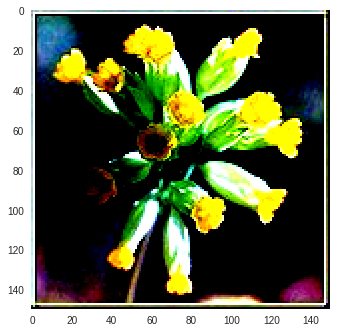

In [33]:
# view the original image
img_show = bytescale(new_img, 0, 1) # make values in new_img go between 0 and 1 to show it in matplotlib
plt.imshow(img_show) # tell it what to show
plt.grid(False) # get rid of the gridlines since this isn't a graph
plt.show() # show the image

(1, 150, 150, 64)


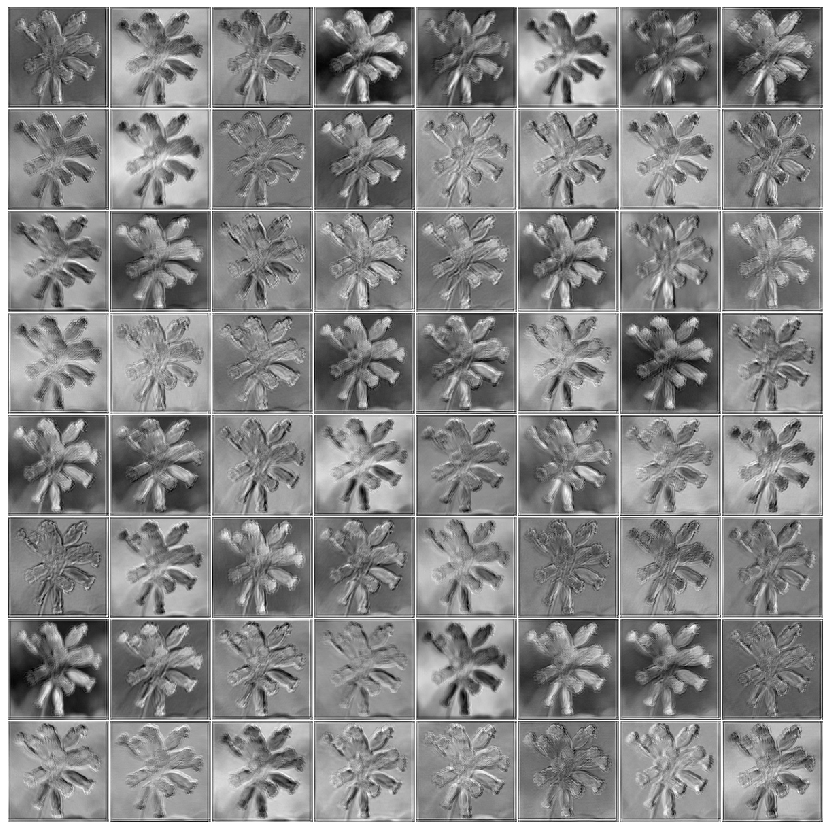

In [35]:
# view the first conv layer's feature maps --- 64 different views of the image to help decide what it is
view_feature_map(load_layer(conv1, new_img))

(1, 150, 150, 64)


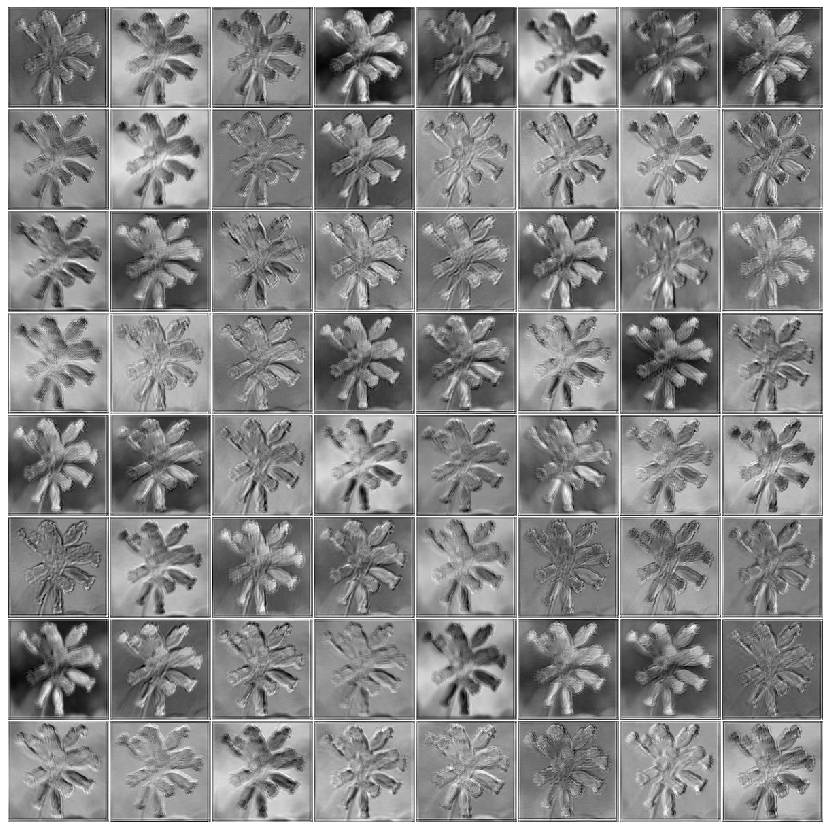

In [36]:
# view results of the normalization layer
view_feature_map(load_layer(batch_norm1, new_img))

(1, 150, 150, 64)


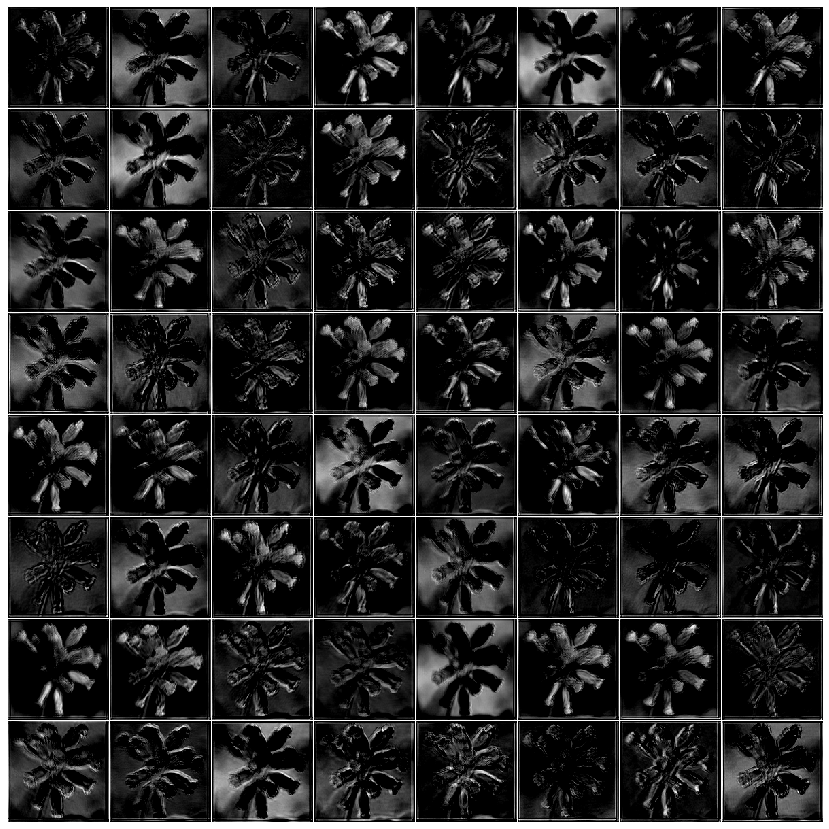

In [37]:
# view results of the rectified linear layer
view_feature_map(load_layer(relu1, new_img))

(1, 75, 75, 64)


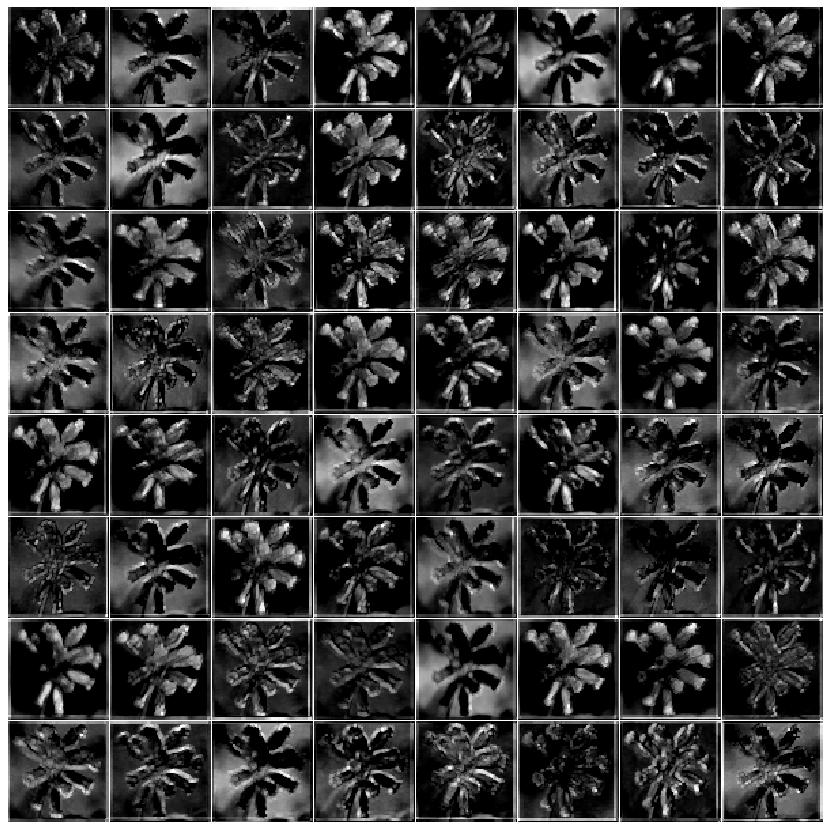

In [38]:
# view results of the pooling layer
view_feature_map(load_layer(pool1, new_img))

(1, 75, 75, 128)


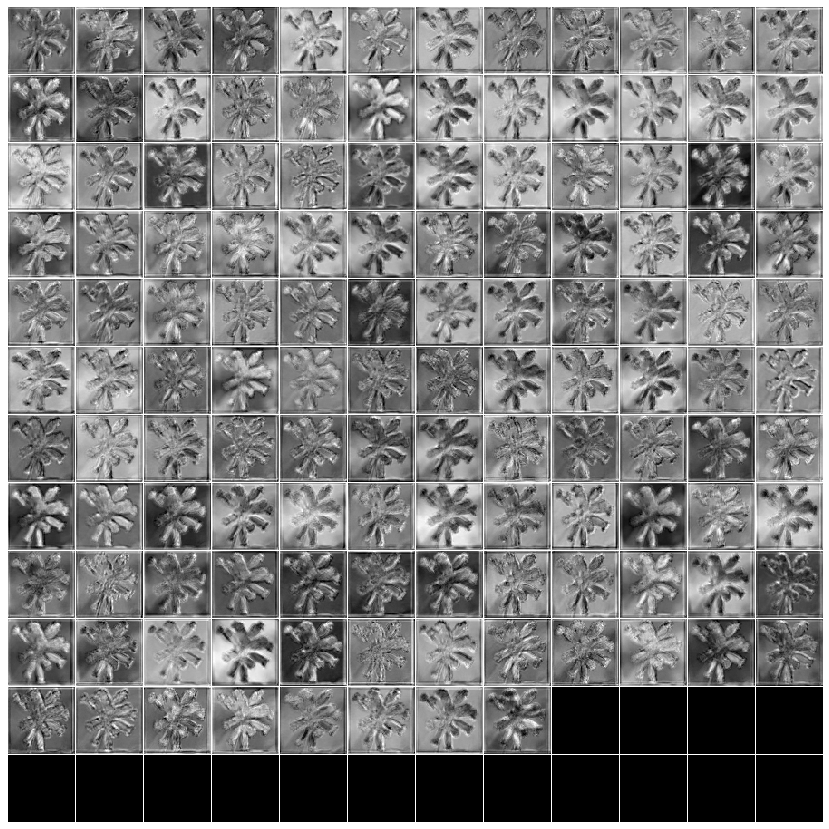

In [39]:
# view results of the second conv layer
view_feature_map(load_layer(conv2, new_img))

(1, 75, 75, 128)


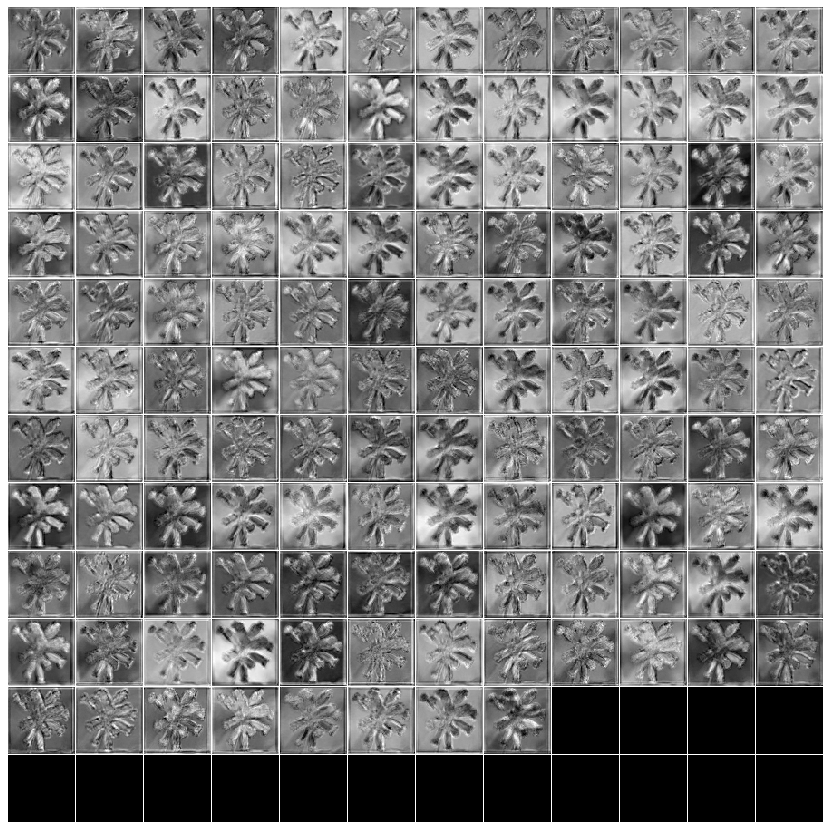

In [40]:
# view results of the second normalization layer
view_feature_map(load_layer(batch_norm2, new_img))

(1, 75, 75, 128)


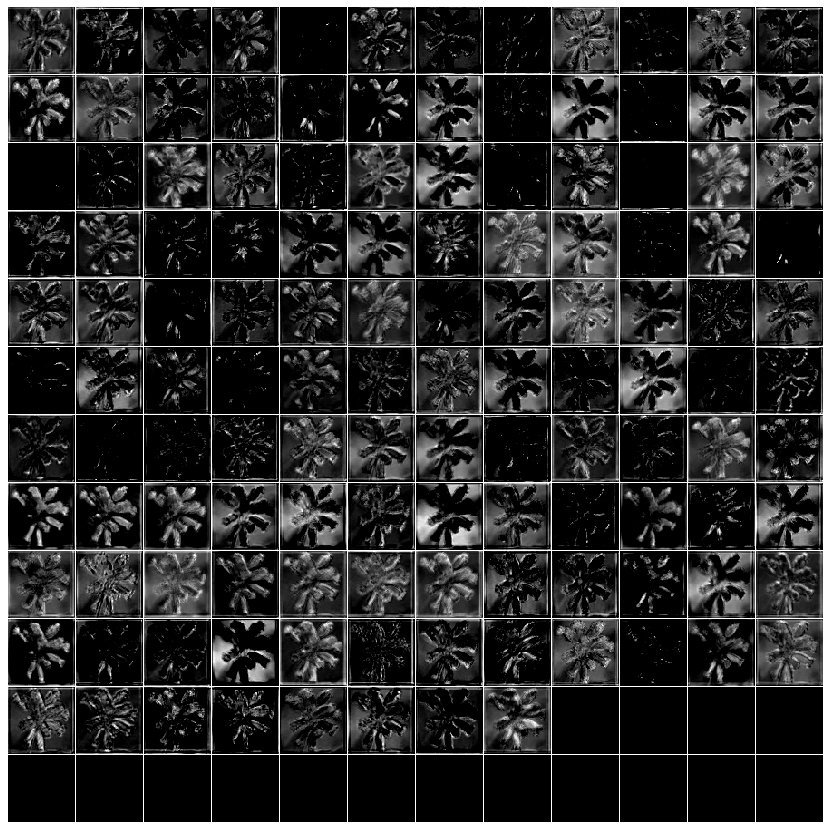

In [41]:
# view results of the second relu layer
view_feature_map(load_layer(relu2, new_img))

(1, 38, 38, 128)


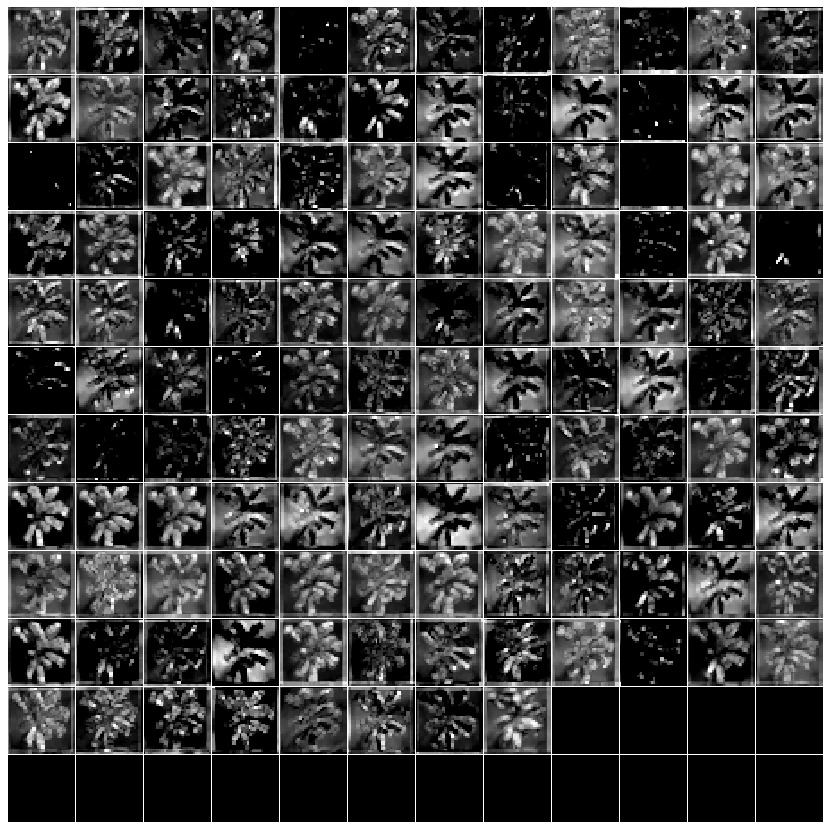

In [42]:
# view results of the second pooling layer
view_feature_map(load_layer(pool2, new_img))

(1, 38, 38, 256)


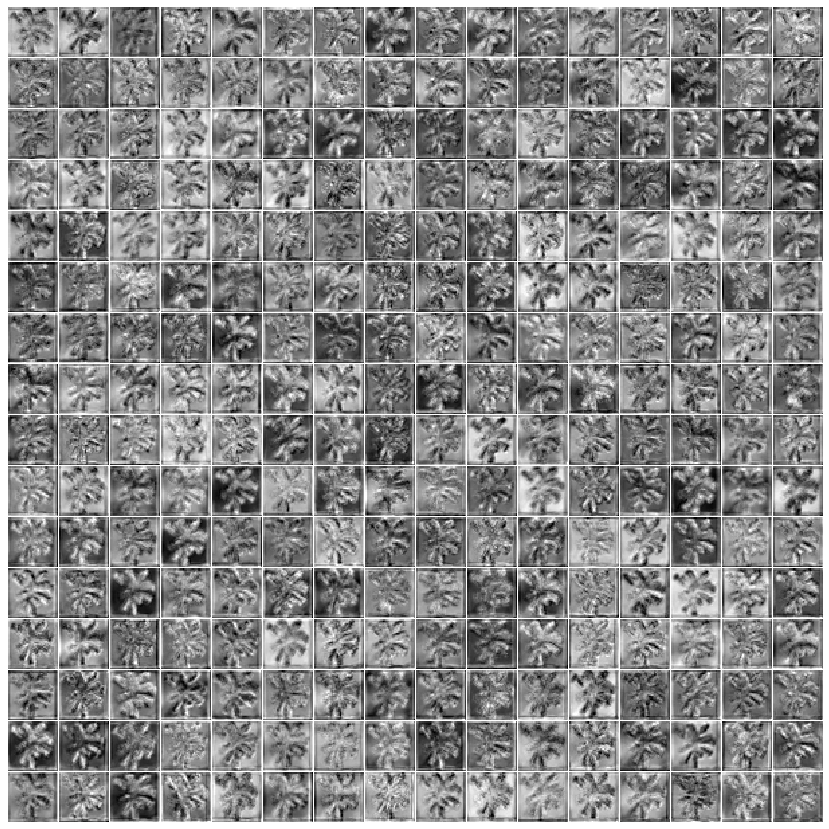

In [43]:
# view results of the third conv layer
view_feature_map(load_layer(conv3, new_img))

(1, 38, 38, 256)


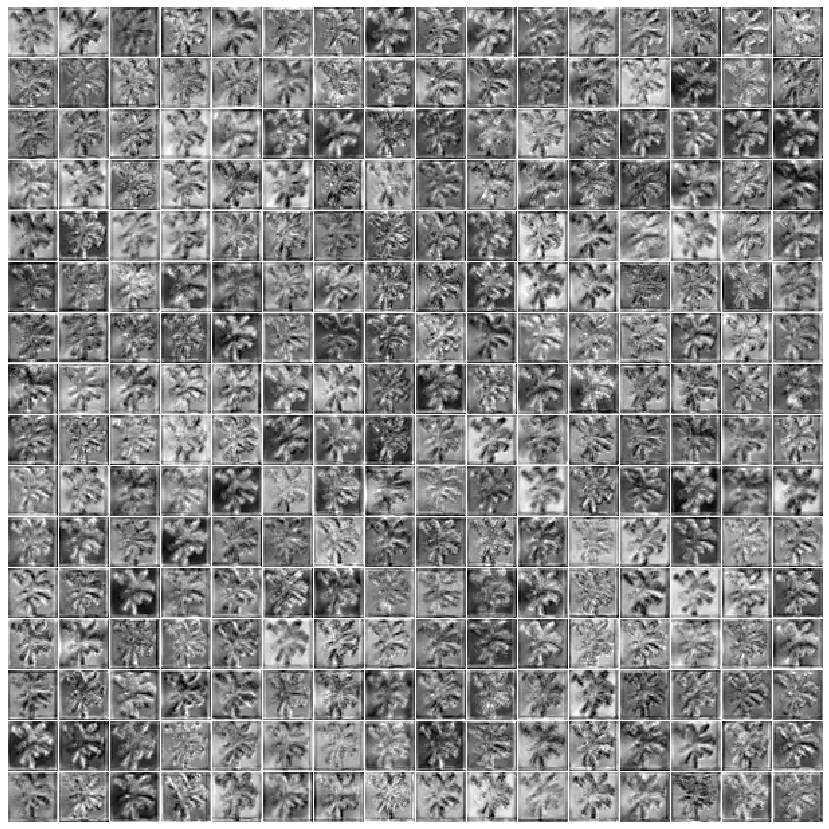

In [44]:
# view results of the third normalization layer
view_feature_map(load_layer(batch_norm3, new_img))

(1, 38, 38, 256)


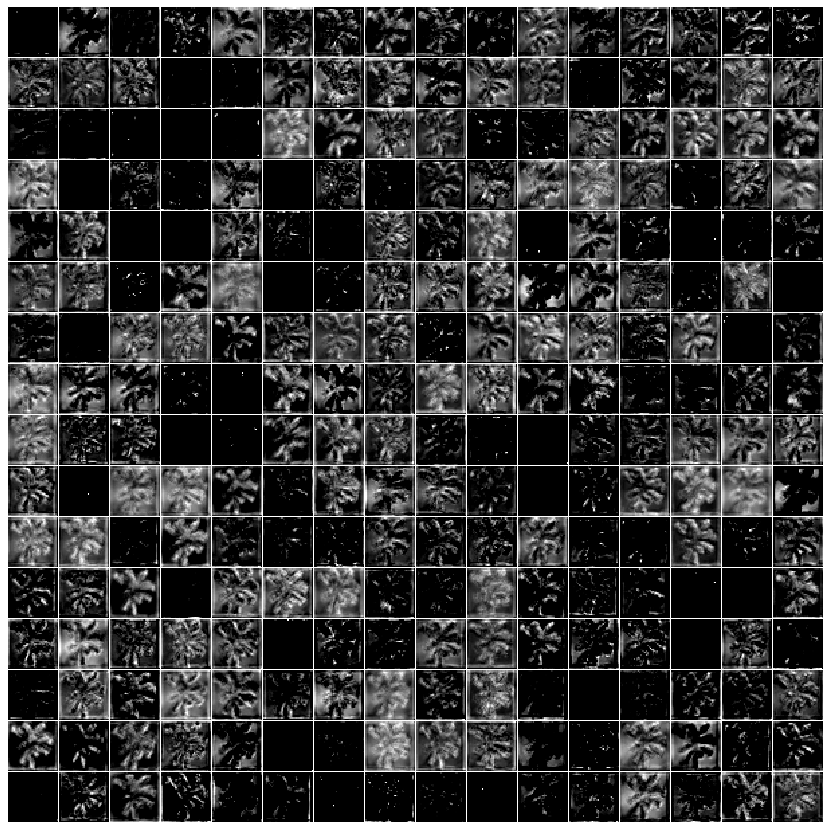

In [46]:
# view results of the third relu layer (average of each of the 256 feature maps)
view_feature_map(load_layer(relu3, new_img))


**From conv1 to batch_norm1:** The feature maps in the batch_norm1 layer don’t look significantly different, so the distribution from the conv1 layer must have been fairly standardized to begin with. 

**From batch_norm1 to relu1:** The relu1 layers’s feature maps are darker than the batch_norm1 layer’s becuase the ReLU function changed all of the negative values to zero. The features each filter is looking for are more apparent (i.e. the areas in the image where the nodes found the feature, with the brightness indicating how much they found it).

**From relu1 to pool1:** The feature maps in the pool1 layer are 75 x 75 pixels, which is half the size of the maps in the relu1 layer (150 x 150). Max pooling reduced some dimensionality by taking the maximum across the area with a stride of 2.

**From pool1 to conv2:** In conv2, the images are still the 75 x 75 pixels because it’s taking in the previous pool1 layer. There are 128 maps rather than 64 maps because we now have 128 filters. The filters are now looking for more complex features.

**From conv2 to batch_norm2:** Again, the feature maps in the batch_norm2 layer don’t look significantly different from the conv2 layer, so its distribution was already pretty normalized.

**From batch_norm2 to relu2:** The feature maps in relu2 are much darker than the maps in batch_norm2 because the ReLU function got rid of the negative numbers by setting them all to zero. It’s easier to see the areas that are activating that feature the strongest.

**From relu2 to pool2:** The next pooling layer pool2 reduced the size of the previous relu2 layer from 75 x75 pixels to 38 x 38 pixels by taking the maximum value across the area with a stride of 2.

**From pool2 to conv3:** In conv3, there are now 256 feature maps that are still the same size as those in pool2 (38 x 38 pixels) because we are now using 256 filters, which are looking for more complex combinations of features.

**From conv3 to batch_norm3:** Once again, the feature maps in batch_norm3 don’t look much different from those in conv3 because the distribution in conv3 was already pretty normal.

**From batch_norm3 to relu3:** The relu3 layer is again darker than the previous batch_norm3 layer because the negative values are now zeros. It’s easier to see what areas of the image had the highest activations.
